In [58]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [59]:
x1= pd.read_excel("QVI_transaction_data.xlsx") #load the transaction data as x1
x2= pd.read_csv("QVI_purchase_behaviour.csv")  #load the cst data as x2
x3= pd.read_csv("QVI_data.csv")

In [60]:
x3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264834 entries, 0 to 264833
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   LYLTY_CARD_NBR    264834 non-null  int64  
 1   DATE              264834 non-null  object 
 2   STORE_NBR         264834 non-null  int64  
 3   TXN_ID            264834 non-null  int64  
 4   PROD_NBR          264834 non-null  int64  
 5   PROD_NAME         264834 non-null  object 
 6   PROD_QTY          264834 non-null  int64  
 7   TOT_SALES         264834 non-null  float64
 8   PACK_SIZE         264834 non-null  int64  
 9   BRAND             264834 non-null  object 
 10  LIFESTAGE         264834 non-null  object 
 11  PREMIUM_CUSTOMER  264834 non-null  object 
dtypes: float64(1), int64(6), object(5)
memory usage: 24.2+ MB


In [61]:
x3.head()

,LYLTY_CARD_NBR,DATE,STORE_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACK_SIZE,BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,2018-10-17,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,NATURAL,YOUNG SINGLES/COUPLES,Premium
1,1002,2018-09-16,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7,150,RRD,YOUNG SINGLES/COUPLES,Mainstream
2,1003,2019-03-07,1,3,52,Grain Waves Sour Cream&Chives 210G,1,3.6,210,GRNWVES,YOUNG FAMILIES,Budget
3,1003,2019-03-08,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0,175,NATURAL,YOUNG FAMILIES,Budget
4,1004,2018-11-02,1,5,96,WW Original Stacked Chips 160g,1,1.9,160,WOOLWORTHS,OLDER SINGLES/COUPLES,Mainstream


In [62]:
df = pd.merge(x1 ,x2 , on="LYLTY_CARD_NBR", how="left") #merge both tables with the common column in a single table
df

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,LIFESTAGE,PREMIUM_CUSTOMER
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,YOUNG SINGLES/COUPLES,Premium
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,MIDAGE SINGLES/COUPLES,Budget
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,MIDAGE SINGLES/COUPLES,Budget
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,MIDAGE SINGLES/COUPLES,Budget
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,YOUNG SINGLES/COUPLES,Premium
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,YOUNG SINGLES/COUPLES,Premium
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,YOUNG SINGLES/COUPLES,Premium
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,YOUNG SINGLES/COUPLES,Premium


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   DATE              264836 non-null  int64  
 1   STORE_NBR         264836 non-null  int64  
 2   LYLTY_CARD_NBR    264836 non-null  int64  
 3   TXN_ID            264836 non-null  int64  
 4   PROD_NBR          264836 non-null  int64  
 5   PROD_NAME         264836 non-null  object 
 6   PROD_QTY          264836 non-null  int64  
 7   TOT_SALES         264836 non-null  float64
 8   LIFESTAGE         264836 non-null  object 
 9   PREMIUM_CUSTOMER  264836 non-null  object 
dtypes: float64(1), int64(6), object(3)
memory usage: 20.2+ MB


In [64]:
# df["DATE"] values are likely an Excel serial date,
# which represents the number of days since January 1, 1900 (Excel's default date system).

df["DATE"] = pd.to_datetime(df["DATE"], origin="1899-12-30", unit="D")  #to change to datetime format 
df[["STORE_NBR" ,"LYLTY_CARD_NBR","TXN_ID", "PROD_NBR" ]] =df[
    ["STORE_NBR" ,"LYLTY_CARD_NBR","TXN_ID", "PROD_NBR" ]].astype(object)  #to change to IDs columns to obj format

In [65]:
df["prod_price"] = df["TOT_SALES"] / df["PROD_QTY"]    #  creat a new col for all products price

In [66]:
df[df.duplicated()] #to check duplicated rows

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,LIFESTAGE,PREMIUM_CUSTOMER,prod_price
124845,2018-10-01,107,107024,108462,45,Smiths Thinly Cut Roast Chicken 175g,2,6.0,OLDER SINGLES/COUPLES,Premium,3.0


In [67]:
df.drop_duplicates(inplace=True) #deleted the duplicated rows

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 264835 entries, 0 to 264835
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   DATE              264835 non-null  datetime64[ns]
 1   STORE_NBR         264835 non-null  object        
 2   LYLTY_CARD_NBR    264835 non-null  object        
 3   TXN_ID            264835 non-null  object        
 4   PROD_NBR          264835 non-null  object        
 5   PROD_NAME         264835 non-null  object        
 6   PROD_QTY          264835 non-null  int64         
 7   TOT_SALES         264835 non-null  float64       
 8   LIFESTAGE         264835 non-null  object        
 9   PREMIUM_CUSTOMER  264835 non-null  object        
 10  prod_price        264835 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 24.2+ MB


In [69]:
df["PROD_NAME"] # split product name and weight to a separate columns

0           Natural Chip        Compny SeaSalt175g
1                         CCs Nacho Cheese    175g
2           Smiths Crinkle Cut  Chips Chicken 170g
3           Smiths Chip Thinly  S/Cream&Onion 175g
4         Kettle Tortilla ChpsHny&Jlpno Chili 150g
                            ...                   
264831     Kettle Sweet Chilli And Sour Cream 175g
264832               Tostitos Splash Of  Lime 175g
264833                    Doritos Mexicana    170g
264834     Doritos Corn Chip Mexican Jalapeno 150g
264835               Tostitos Splash Of  Lime 175g
Name: PROD_NAME, Length: 264835, dtype: object

In [70]:
df[["product_name" , "weight"]]=df["PROD_NAME"].str.extract(r'([^\d]*)(\d.*)') # to extract numercal values from the PROD_NAME col
df[["weight_g" , "na"]]= df["weight"].str.extract(r'(\d*)(\D.*)?').fillna('') #to extract the num value only.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 264835 entries, 0 to 264835
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   DATE              264835 non-null  datetime64[ns]
 1   STORE_NBR         264835 non-null  object        
 2   LYLTY_CARD_NBR    264835 non-null  object        
 3   TXN_ID            264835 non-null  object        
 4   PROD_NBR          264835 non-null  object        
 5   PROD_NAME         264835 non-null  object        
 6   PROD_QTY          264835 non-null  int64         
 7   TOT_SALES         264835 non-null  float64       
 8   LIFESTAGE         264835 non-null  object        
 9   PREMIUM_CUSTOMER  264835 non-null  object        
 10  prod_price        264835 non-null  float64       
 11  product_name      264835 non-null  object        
 12  weight            264835 non-null  object        
 13  weight_g          264835 non-null  object        
 14  na       

In [71]:
df.sample(5)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,LIFESTAGE,PREMIUM_CUSTOMER,prod_price,product_name,weight,weight_g,na
23424,2018-12-05,213,213141,212819,112,Tyrrells Crisps Ched & Chives 165g,2,8.4,MIDAGE SINGLES/COUPLES,Premium,4.2,Tyrrells Crisps Ched & Chives,165g,165,g
214299,2019-02-13,217,217107,216798,102,Kettle Mozzarella Basil & Pesto 175g,2,10.8,YOUNG FAMILIES,Mainstream,5.4,Kettle Mozzarella Basil & Pesto,175g,175,g
140079,2018-09-21,78,78102,76049,80,Natural ChipCo Sea Salt & Vinegr 175g,2,6.0,RETIREES,Budget,3.0,Natural ChipCo Sea Salt & Vinegr,175g,175,g
213367,2018-09-06,191,191142,192603,1,Smiths Crinkle Cut Chips Barbecue 170g,2,5.8,YOUNG FAMILIES,Mainstream,2.9,Smiths Crinkle Cut Chips Barbecue,170g,170,g
119156,2019-04-18,19,19209,16487,102,Kettle Mozzarella Basil & Pesto 175g,2,10.8,OLDER SINGLES/COUPLES,Premium,5.4,Kettle Mozzarella Basil & Pesto,175g,175,g


In [72]:
df.rename(columns={"PREMIUM_CUSTOMER" : "customer_categ"}, inplace=True)         #change PREMIUM_CUSTOMER column name to customer_categ
df = df.drop(columns=(["PROD_NAME","weight","na"]))                 # remove "prod_name", "weight" and "na" columns.
df.columns = df.columns.str.lower().str.strip()      # to make df columns name in a small letters without any spaces

In [73]:
df[["prod_qty","tot_sales" ]].describe().round()

,prod_qty,tot_sales
count,264835.0,264835.0
mean,2.0,7.0
std,1.0,3.0
min,1.0,2.0
25%,2.0,5.0
50%,2.0,7.0
75%,2.0,9.0
max,200.0,650.0


In [74]:
px.box(df[["prod_qty","tot_sales" ]])  #to chech outliers values.

In [75]:
print(df["prod_qty"].sort_values(ascending=False)) 
print("_______________________________________________")
print(df["tot_sales"].sort_values(ascending=False))                #high values overview for both columns

69762     200
69763     200
204367      5
55501       5
69815       5
         ... 
82354       1
82357       1
172438      1
82358       1
32479       1
Name: prod_qty, Length: 264835, dtype: int64
_______________________________________________
69762     650.0
69763     650.0
171815     29.5
150683     29.5
55558      29.5
          ...  
81748       1.5
116387      1.5
148454      1.5
149524      1.5
3653        1.5
Name: tot_sales, Length: 264835, dtype: float64


In [76]:
IQR = df["prod_qty"].quantile(.75)-df["prod_qty"].quantile(.25)    #to check UB, LB and IQR
lower = df["prod_qty"].quantile(.25) -(1.5*IQR)
upper =df["prod_qty"].quantile(.75)+ (1.5 * IQR)
print(IQR,upper,lower)

0.0 2.0 2.0


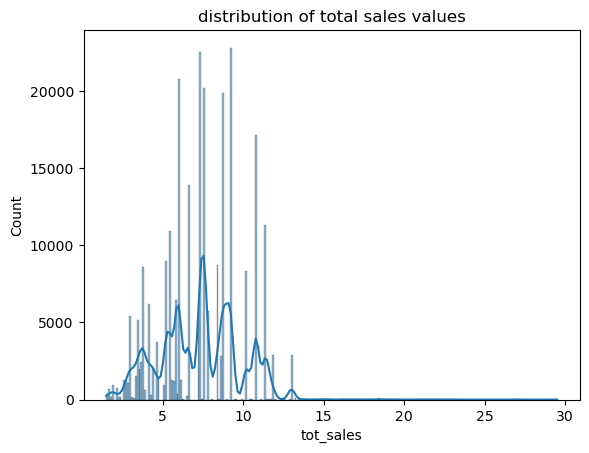

In [77]:
df = df[df["prod_qty"] <= 29.5]  #remove outlayers up to 29.5 for products QTY
df.reset_index(drop=True)
df[["prod_qty","tot_sales" ]]
sns.histplot(df["tot_sales"],kde=True)
plt.title("distribution of total sales values");

<h1 style="text-align: center;"><strong>Customers Segmentation Analysis</strong></h1>

In [78]:
df.sample(5)

,date,store_nbr,lylty_card_nbr,txn_id,prod_nbr,prod_qty,tot_sales,lifestage,customer_categ,prod_price,product_name,weight_g
4862,2019-01-08,261,261008,259739,102,2,10.8,MIDAGE SINGLES/COUPLES,Budget,5.4,Kettle Mozzarella Basil & Pesto,175
175182,2019-05-12,64,64324,61612,60,2,9.2,RETIREES,Premium,4.6,Kettle Tortilla ChpsFeta&Garlic,150
67010,2019-05-10,222,222010,221571,90,2,8.8,OLDER FAMILIES,Mainstream,4.4,Tostitos Smoked Chipotle,175
62715,2019-05-27,130,130159,134332,70,2,8.4,OLDER FAMILIES,Mainstream,4.2,Tyrrells Crisps Lightly Salted,165
166976,2019-06-17,212,212075,210917,45,2,6.0,RETIREES,Mainstream,3.0,Smiths Thinly Cut Roast Chicken,175


In [79]:
unique =  df[[ "lifestage" , "customer_categ"  ]]    # to check lifestage and premium_customer values
for col in unique.columns :
    print(f"{col} unique values are {unique[col].unique()}, count is {unique[col].nunique()}")
    print("________________________________________")

lifestage unique values are ['YOUNG SINGLES/COUPLES' 'MIDAGE SINGLES/COUPLES' 'NEW FAMILIES'
 'OLDER FAMILIES' 'OLDER SINGLES/COUPLES' 'RETIREES' 'YOUNG FAMILIES'], count is 7
________________________________________
customer_categ unique values are ['Premium' 'Budget' 'Mainstream'], count is 3
________________________________________


In [80]:
unique =  df[[ "store_nbr" , "lylty_card_nbr" , "product_name" , "weight_g" ]] # to check stores, customers, products and  products weight count. 
for col in unique.columns :
    print(f"{col} unique values Number is {unique[col].nunique()}")
    print("________________________________________")

store_nbr unique values Number is 272
________________________________________
lylty_card_nbr unique values Number is 72636
________________________________________
product_name unique values Number is 114
________________________________________
weight_g unique values Number is 21
________________________________________


In [81]:
px.pie(data_frame=df.groupby("lifestage")["lylty_card_nbr"].count().reset_index().               #customers count in each Life Stages
       rename(columns={"lylty_card_nbr":"count"}) , values="count" , names= "lifestage",
       title= "Customers Count in each Lifestages").update_layout(title_x=0.5)

In [82]:
display(px.bar(df.groupby("lifestage")["tot_sales"].agg(sum).round().sort_values(ascending=False),
               text_auto=True,title="Revenues per Lifestage").update_layout(title_x=0.5))
display(px.bar(df.groupby("lifestage")["txn_id"].agg("nunique").round().sort_values(ascending=False),
               text_auto=True, title="orders count per Lifestage").update_layout(title_x=0.5))
display(px.bar(df.groupby("lifestage")["prod_qty"].agg(sum).round().sort_values(ascending=False),text_auto=True,
                title="sold items count per Lifestage").update_layout(title_x=0.5))

<div>
<ul>
<li style="text-align: left; padding-left: 30px;">
<h3>[Older singles/couples, Retirees and Older families] are our top 3 valued lifestage regarding the revenue amount, orders count and sold items number.</h3>
</li>
<li style="padding-left: 30px;">
<h3>Older singles/couples lifestage ranks first for Revenue amount by around <span style="text-decoration: underline;">402.4K</span>, orders count by <span style="text-decoration: underline;">54.14K</span> and sold items count <span style="text-decoration: underline;">104.2K</span>.</h3>
</li>
<li style="padding-left: 30px;">
<h3>Retirees comes in the 2nd stage by around <span style="text-decoration: underline;">366.5K</span> and orders count by <span style="text-decoration: underline;">49.5K</span>, followed by Older families for Revenue amount by around <span style="text-decoration: underline;">352.5K</span> and orders count by <span style="text-decoration: underline;">48.1K</span>.</h3>
</li>
<li style="text-align: left; padding-left: 30px;">
<h3>Although Retirees comes in the 3rd stage for sold item count by around <span style="text-decoration: underline;">94.1K</span>, they comes in the 2nd stage by Revenue amount.</h3>
</li>
<li style="padding-left: 30px;">
<h3>[NEW FAMILIES] is the lowest Life stage that buying our product.</h3>
</li>
</ul>
</div>

In [83]:
px.scatter(data_frame=df.groupby("lifestage")["customer_categ"].value_counts().reset_index(),x="lifestage",y="count",color="customer_categ",size="count",
            title="Customers Category Count Per each life Stage").update_layout(title_x=0.5)

<div>
<ul>
<li style="text-align: left;">
<h3>Most of [Older singles/couples and Older families] life stage customers are on Budget category followed by Mainstream category but in a very small difference in Older singles/couples life stage.</h3>
</li>
<li style="text-align: left;">
<h3>Mainstream category has the largest customers count in [Retirees] Life stage, followed by Budget category then Premium category.</h3>
</li>
</ul>
</div>

In [84]:
display(px.pie(data_frame=df.groupby(["customer_categ"],as_index=False)["tot_sales"].sum(),
              values="tot_sales",names="customer_categ",title="Revenues Per each Category").update_layout(title_x=0.5))
display(px.pie(data_frame=df.groupby("customer_categ")["lylty_card_nbr" ].nunique().reset_index().    #customers count in each category
       rename(columns={"lylty_card_nbr" : "count"}),
       values="count",names="customer_categ",
       title="Customers Count in each Category").update_layout(title_x=0.5))
display(px.pie(data_frame=df.groupby(["customer_categ"], as_index=False)["txn_id"].nunique(), values="txn_id", names="customer_categ",
               title="Orders Num Per each Category").update_layout(title_x=0.5))

<ul style="list-style-type: circle;">
<li>
<h3>The majority of customers belonged to the Mainstream category, with 29,245 cust, followed by the Budget category, which had 24,471cust.</h3>
</li>
</ul>
<hr />
<p>&nbsp;</p>

<p>&nbsp;</p>
<hr /><hr /><hr />
<h1 style="text-align: center;"><span style="text-decoration: underline;">Sales Analysis</span></h1>

<ul style="list-style-type: circle;">
<li>
<div>
<h3>Create a new grouped table with customer count, sold items count, sold products price and total revenue over the year</h3>
</div>
</li>
</ul>

In [85]:
grouping = df.groupby("date" , as_index=False)[["lylty_card_nbr","prod_qty", "prod_price" , "tot_sales"  ]].agg(["nunique" , "sum"]).set_index("date") 
grouping.columns = ["cst_count" ,"cst_sum" ,"sold_items_ncount" ,"sold_items_count" ,"sold_prod_price_count" ,"sold_prod_price" , "rev_count" , "total_revenue"]
grouping.drop(columns=["cst_sum" , "rev_count","sold_items_ncount", "sold_prod_price_count" ,"rev_count" ] , inplace=True)   #rename the columns
grouping

,cst_count,sold_items_count,sold_prod_price,total_revenue
date,,,,
2018-07-01,720,1394,2784.9,5372.2
2018-07-02,707,1367,2764.5,5315.4
2018-07-03,717,1389,2763.5,5321.8
2018-07-04,708,1373,2755.5,5309.9
2018-07-05,708,1358,2650.6,5080.9
...,...,...,...,...
2019-06-26,720,1380,2787.0,5305.0
2019-06-27,707,1352,2723.2,5202.8
2019-06-28,726,1400,2763.5,5299.6


<Axes: >

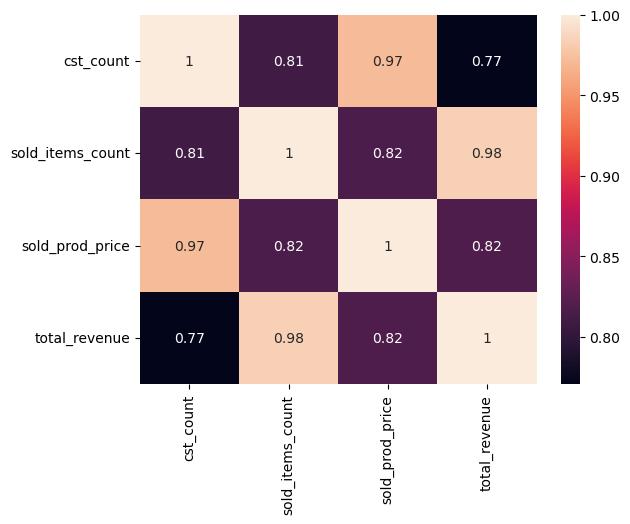

In [86]:
sns.heatmap(grouping.corr(), annot=True)

<ul style="list-style-type: circle;">
<li>
<h3>There is a <span style="text-decoration: underline;">strong positive</span> correlation between <span style="text-decoration: underline;">Sold Items number</span>, <span style="text-decoration: underline;">sold products price</span>, <span style="text-decoration: underline;">Customer Number </span>and <span style="text-decoration: underline;">Total Revenues</span>.</h3>
</li>
</ul>

In [87]:
norm = grouping / grouping.iloc[0 , :]  # for columns values normalization
norm= norm.rolling(30).mean() #calculating rolling statistics for all columns values
px.line(data_frame=norm ,
         y=(["cst_count" ,"sold_items_count" ,"sold_prod_price" ,"total_revenue"]),
                             title="customer NUM, sold items NUM, sold products price and total revenue Trend over the year"
                             ).update_layout(title_x=0.5) #line chart for columns values trend analysis.

<ul style="list-style-type: circle;">
<li>
<h3>The number of sold items decreased in August and September 2018, as well as in May 2019, which negatively impacted total revenue.</h3>
</li>
</ul>

In [88]:
grouping.loc["2018-08-01" : "2018-09-30"].sample(10)         #create a table to fetch the values by the date

,cst_count,sold_items_count,sold_prod_price,total_revenue
date,,,,
2018-08-26,735,1412,2831.40,5397.1
2018-09-16,701,1357,2702.40,5201.5
2018-08-18,731,1154,2774.85,4312.0
2018-08-31,692,1354,2707.30,5210.9
2018-09-20,693,1353,2663.70,5184.9
2018-09-25,772,1497,2984.10,5753.6
2018-08-09,712,1366,2711.40,5206.0
2018-08-11,733,1420,2790.20,5389.3
2018-08-13,758,1452,2940.30,5624.3


In [89]:
df.head()

,date,store_nbr,lylty_card_nbr,txn_id,prod_nbr,prod_qty,tot_sales,lifestage,customer_categ,prod_price,product_name,weight_g
0,2018-10-17,1,1000,1,5,2,6.0,YOUNG SINGLES/COUPLES,Premium,3.00,Natural Chip Compny SeaSalt,175
1,2019-05-14,1,1307,348,66,3,6.3,MIDAGE SINGLES/COUPLES,Budget,2.10,CCs Nacho Cheese,175
2,2019-05-20,1,1343,383,61,2,2.9,MIDAGE SINGLES/COUPLES,Budget,1.45,Smiths Crinkle Cut Chips Chicken,170
3,2018-08-17,2,2373,974,69,5,15.0,MIDAGE SINGLES/COUPLES,Budget,3.00,Smiths Chip Thinly S/Cream&Onion,175
4,2018-08-18,2,2426,1038,108,3,13.8,MIDAGE SINGLES/COUPLES,Budget,4.60,Kettle Tortilla ChpsHny&Jlpno Chili,150


In [90]:
sales = df[["txn_id","store_nbr","lifestage","product_name", "weight_g","tot_sales"]]
sales                                 #create a new sales table 

,txn_id,store_nbr,lifestage,product_name,weight_g,tot_sales
0,1,1,YOUNG SINGLES/COUPLES,Natural Chip Compny SeaSalt,175,6.0
1,348,1,MIDAGE SINGLES/COUPLES,CCs Nacho Cheese,175,6.3
2,383,1,MIDAGE SINGLES/COUPLES,Smiths Crinkle Cut Chips Chicken,170,2.9
3,974,2,MIDAGE SINGLES/COUPLES,Smiths Chip Thinly S/Cream&Onion,175,15.0
4,1038,2,MIDAGE SINGLES/COUPLES,Kettle Tortilla ChpsHny&Jlpno Chili,150,13.8
...,...,...,...,...,...,...
264831,270088,272,YOUNG SINGLES/COUPLES,Kettle Sweet Chilli And Sour Cream,175,10.8
264832,270154,272,YOUNG SINGLES/COUPLES,Tostitos Splash Of Lime,175,4.4
264833,270187,272,YOUNG SINGLES/COUPLES,Doritos Mexicana,170,8.8
264834,270188,272,YOUNG SINGLES/COUPLES,Doritos Corn Chip Mexican Jalapeno,150,7.8


In [91]:
print(f"Orders Number is {sales.txn_id.nunique()} Order")
print("____________________________________________")
print(f"Stors Number is {sales.store_nbr.nunique()} Stor")
print("____________________________________________")
print(f"life stage Number is {sales.lifestage.nunique()} life stage")
print("____________________________________________")
print(f"Products Number is {sales.product_name.nunique()} Product")
print("____________________________________________")
print(f"Product weight Number is {sales.weight_g.nunique()} weight")

Orders Number is 263125 Order
____________________________________________
Stors Number is 272 Stor
____________________________________________
life stage Number is 7 life stage
____________________________________________
Products Number is 114 Product
____________________________________________
Product weight Number is 21 weight


In [92]:
display(px.bar(sales["product_name"].value_counts().head(20),text_auto=True ,
                title="Top 20 Products Best seller").update_layout(title_x=0.5))
display(px.bar(sales["product_name"].value_counts().tail(20),text_auto=True 
               , title="Lowest 20 products seller").update_layout(title_x=0.5))                #bar charts for product sales number

In [93]:
px.bar(data_frame=sales["weight_g"].value_counts().sort_values(ascending=False).reset_index() ,
        x="weight_g" , y="count" , text_auto=True, title="Products Sales count per weight "
        ).update_layout(title_x=0.5)                         # bar chart for Products Sales count per weight

<ul>
<li>
<h3>Products weighing 175g, followed by those at 150g, are our best-selling items. In contrast, products at 125g and 180g have the lowest sales rates.</h3>
</li>
<li>
<h3>I recommend introducing more attractive offers on products weighing 125g, 180g, and 70g to boost sales. Additionally, we should offer competitive promotions on 175g and 150g products while ensuring strong deals for the lowest-selling items like <span style="text-decoration: underline;">(WW Crinkel Cut orignal and frensh fries Potato Chips )</span>.</h3>
</li>
</ul>

In [99]:
store = sales.groupby("store_nbr", as_index=False)["tot_sales"].agg(["count", "sum"]).sort_values(by="sum" , ascending=True).head(10)
store.store_nbr = store.store_nbr.astype("object")
store.columns = ['store_nbr', 'orders_count', 'revenues']
store


,store_nbr,orders_count,revenues
210,211,2,5.2
75,76,1,6.0
10,11,2,6.7
251,252,2,7.4
205,206,2,7.6
91,92,1,9.2
192,193,3,13.1
84,85,3,13.9
30,31,2,14.8
116,117,46,161.8


In [98]:
px.bar(data_frame=store , x="store_nbr", y="revenues", color="orders_count" ,text_auto=True , title="Lowest 20 stores Revenue").update_layout(title_x=0.5)

<ul>
<li>
<h3>So We need to check the sales plan against stores with the lowest purchases.</h3>
</li>
</ul>

<p>&nbsp;</p>
<hr /><hr /><hr />
<h1 style="text-align: center;"><span style="text-decoration: underline;"></span></h1>

## Regards,
### Hamed